# Feature Selection - Performed with reduced data without missing Financial Ratios (~72k rows)

## Import Data

__DataFrames:__  
df_model - df with all the features (independent festures + Target)  
x - df with all independent features
y - df with dependent feature  
x_train - df with training data from x  
x_train_out - df with training data from x with outliers treatment applied  
x_test - df with test data from x  
x_test_out - df with test data from x with outliers treatment applied  



CAPM
Import data from: ..\SampleData\Sample\LongTerm-DataPreparation_Skew.csv
Original CAPM is being used as Target
Nr of rows:
72538


<Figure size 640x480 with 0 Axes>

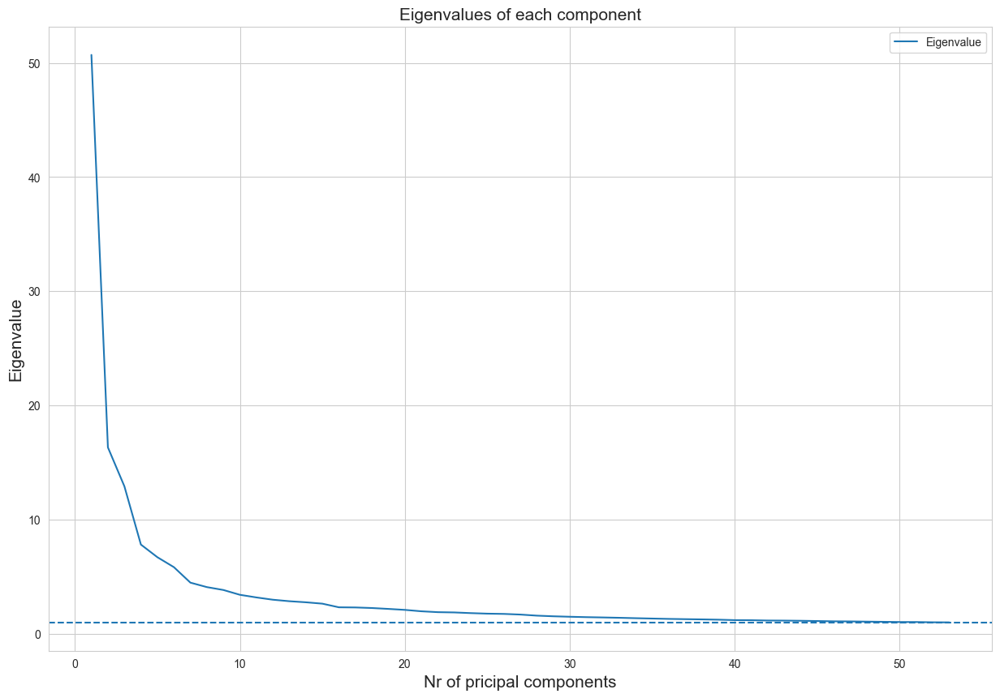

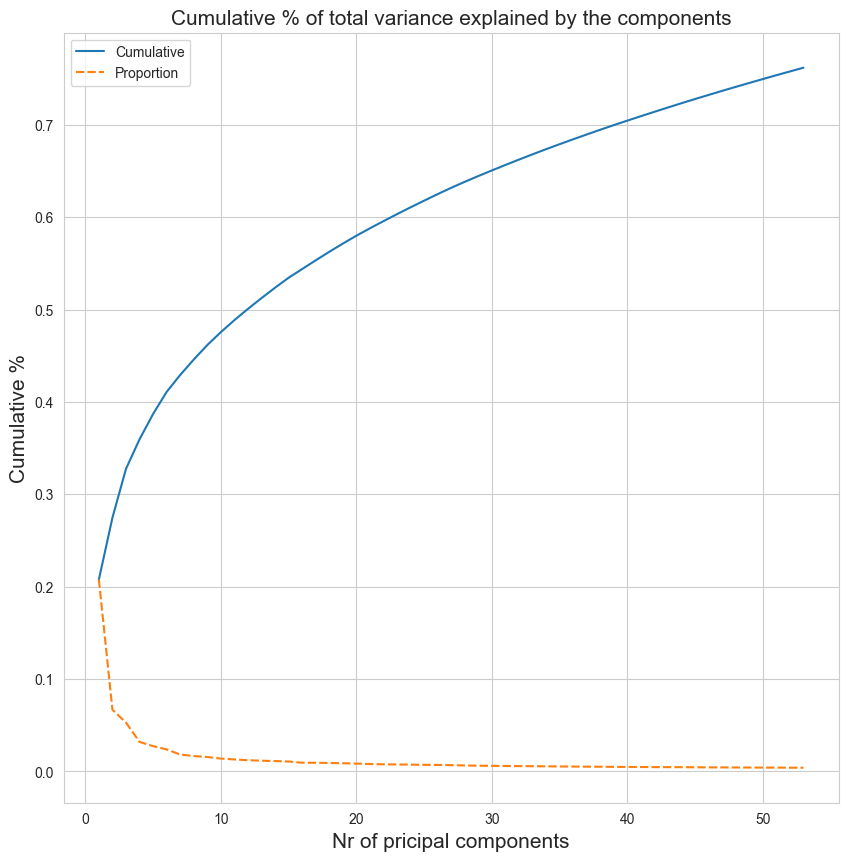

The variance explained by each component is: [50.70262543 16.3180414  12.90616231  7.80559243  6.69692605  5.82614766
  4.47015907  4.07836541  3.82626867  3.40508117  3.17395217  2.97398597
  2.84255924  2.7491931   2.6284572   2.30920491  2.29580116  2.24676716
  2.1685526   2.08344875  1.96058327  1.88331954  1.85945512  1.79999003
  1.75303096  1.72999438  1.67342676  1.57892838  1.52235707  1.48115797
  1.44613583  1.42029951  1.39091026  1.35520895  1.32448072  1.29342424
  1.27059382  1.25051426  1.2247642   1.18608517  1.17810508  1.15156743
  1.14454538  1.12935887  1.10669478  1.0815426   1.07222534  1.05458183
  1.03848544  1.01988948  1.01877496  0.99533768  0.98807987]
The total variance explained by the components is: 0.7618344466001962


In [1]:
import sys
#define path to get paths
pathsPath = r'D:\Code\RD\Paths'

if pathsPath not in sys.path:
    sys.path.insert(1, pathsPath)

#import paths
import definePaths as pathsMain

#set paths
fmpPath = pathsMain.get_FMPapi_path()
functions_path = pathsMain.get_insertMlFunctions_path()

#create a list of paths
pathList = [fmpPath, functions_path]
#set personal code paths
for index, path in enumerate(pathList):
    id_ = index +1
    sys.path.insert(id_, path)
sys.path.insert(3, r'..')

import Visualizations_Functions as viz 
import Classification_CV as class_cv
import DataPreparation as preprocess 
import FeatureExtraction as ft_extract 
import DataScalling as scalling
import FeatureSelection as ft_selection
import importCleanedData as importData
import importSubsets as subsets

from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, StackingClassifier
from tensorflow import keras

import pandas as pd
import numpy as np 

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.tree import DecisionTreeClassifier

import warnings
warnings.filterwarnings('ignore')

#set preferences
sns.set_style('whitegrid')

#set color for graphs
#set color for graphs
palette = ["#e41a1c", "#377eb8", "#4daf4a", "#984ea3"]


dir = r'..\SampleData\Sample'
df_model_skew,df_target = importData.importCleanedData(dir=dir,target='CAPM')


#split data
date = '2018-01-01'
#split data without transformation
x_train,x_train_out,x_test, x_test_out,y_train_dict ,y_test_dict, y_train,y_test = importData.splitData(df_model_skew, date) 


#set columns
ratio_cols = df_model_skew.columns[(df_model_skew.columns.str.contains('Ratio'))]
shares_cols = df_model_skew.columns[(df_model_skew.columns.str.contains('Share'))]
margin_cols = df_model_skew.columns[(df_model_skew.columns.str.contains('Margin'))]
turnover_cols = df_model_skew.columns[(df_model_skew.columns.str.contains('Turnover'))]
dividend_cols = df_model_skew.columns[(df_model_skew.columns.str.contains('dividend'))]


components_pca, pca_components_test = importData.runPCA(x_train_out= x_train_out,x_test = x_test)


#import subsets
lasso_subset_0, lasso_subset_15, mi_subset_0, mi_subset_15, lgb_subset, corr_subset0, corr_subset15 = subsets.importSubsets()
subset_0, subset_15 = lasso_subset_0, lasso_subset_15

## Feature Selection

In [4]:
#feature selection
def lasso_selection (x, y,coef_ = 0):
    '''''''''''''''
    Performs lasso selection 
    Receives:
        x and y  
        coef indicating the min absolute coeficient of the most important features, predefined to 0
    
    '''''''''''''''
    import time
    start_time = time.time()
    print('Performing Lasso Selection')
    
    from sklearn.linear_model import Lasso
    reg = Lasso(alpha=0.005,random_state=0)
    reg.fit(x,y)
    coef = pd.Series(reg.coef_, index = x.columns)
    
    print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
    print(f'Min absolute coef: {coef_}')
    coef = coef.loc[abs(coef.values)>coef_]
    
    
    print(f'Total variables in subset: {len(coef)}')
    print(' ')
    print('Lasso Selection lasted:')
    print("--- %s seconds ---" % (time.time() - start_time)) 
    return(coef)

def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    

def mutual_information_classification (x,y,n_best):
    '''''''''''''''
    Performs mutual information selection using 
    Receives:
        x and y 
        nr_best, representing the nr of independent variables to keep in the selection
    Note: use in regression problems
    
    '''''''''''''''
    import time
    start_time = time.time()
    from sklearn.feature_selection import mutual_info_classif
    
    n_best = n_best
    scores = (mutual_info_classif(x, y))
    mi_scores = pd.DataFrame()
    mi_scores['Coef'] = scores
    mi_scores['features'] = x.columns
    mi_scores = mi_scores.sort_values(ascending=False, by='Coef')[:n_best]
    
    print(f'Top {n_best} variables according to mutual information:')
    print(mi_scores.features.unique())
    print(' ')
    print('Mutual Information Selection lasted:')
    print("--- %s seconds ---" % (time.time() - start_time))             
    return(mi_scores)


def get_FeatureImportance (name_list,feature_list):
    '''''''''''
    it receives a list with the desired subset names and a list of lists containing the features of each subset
    The function creates a datafrane where each row represents a feature and the goal is to identify the most common features chosen by the different festure selection algorthms
    
    
    '''''''''
    t = pd.DataFrame(columns =x_train.columns, index = name_list )
    subset_list = feature_list

    for i,ii in zip(subset_list, np.arange(0,len(t.index))):
        t.iloc[ii][i] = 1


    t = t.T.fillna(0)

    t['totalCount'] = t.sum(axis=1)
    

    t = t.sort_values(by= 'totalCount',ascending=False)
    return(t)


### Light Gradient Booster

In [2]:
def replaceColumnNames (df):
    import re
    df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
    return(df)

x_train = replaceColumnNames(x_train)
x_test = replaceColumnNames(x_test)

import lightgbm as lgb
cols = x_train.select_dtypes(exclude = np.object).columns
model = lgb.LGBMClassifier(max_depth = 5,
                           class_weight = 'balanced',
                           random_state=  0)
model.fit(x_train[cols],
          y_train)


ft_importance = pd.DataFrame(index = cols)
ft_importance['featureImportance'] = model.feature_importances_
print(ft_importance.sort_values(ascending=False, by='featureImportance').iloc[:20])


model.score(x_test[cols], y_test)

pred = model.predict(x_train[cols])
pred_test = model.predict(x_test[cols])
class_cv.metrics(y_train, pred, y_test, pred_test)


LGBcols = ft_importance.sort_values(ascending=False, by='featureImportance').iloc[:20].index

                            featureImportance
Volatility_84                              76
close                                      72
Volatility_42                              49
priceEarningsRatio                         42
Volatility_21                              39
YoY_revenue                                39
Volatility_63                              35
excessReturn_84                            33
goodwill                                   32
alpha                                      31
priceToSalesRatio                          31
retainedEarnings                           30
YoY_grossProfit                            28
excessReturn_21                            25
enterpriseValueMultiple                    24
priceEarningsToGrowthRatio                 23
YoY_netIncome                              23
YoY_operatingIncome                        23
priceBookValueRatio                        23
MA_21                                      23
__________________________________

In [40]:
def replaceColumnNames (df):
    import re
    df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
    return(df)

x_train = replaceColumnNames(x_train)
x_test = replaceColumnNames(x_test)

import lightgbm as lgb
cols = x_train.select_dtypes(exclude = np.object).columns
model = lgb.LGBMClassifier(max_depth = 5,
                           class_weight = 'balanced',
                           random_state=  0)
model.fit(x_train[cols],
          y_train)


ft_importance = pd.DataFrame(index = cols)
ft_importance['featureImportance'] = model.feature_importances_
print(ft_importance.sort_values(ascending=False, by='featureImportance').iloc[:20])


model.score(x_test[cols], y_test)

pred = model.predict(x_train[cols])
pred_test = model.predict(x_test[cols])
class_cv.metrics(y_train, pred, y_test, pred_test)


LGBcols = ft_importance.sort_values(ascending=False, by='featureImportance').iloc[:20].index

                                         featureImportance
close                                                   82
Volatility_84                                           77
priceEarningsRatio                                      45
Volatility_42                                           40
YoY_revenue                                             37
enterpriseValueMultiple                                 36
Volatility_63                                           36
MA_21                                                   33
priceToSalesRatio                                       32
Volatility_21                                           32
priceToOperatingCashFlowsRatio                          26
goodwill                                                26
dividendYield                                           25
retainedEarnings                                        25
accumulatedOtherComprehensiveIncomeLoss                 25
YoY_netIncome                                           

### Lasso 

#### Lasso for each Target

In [30]:
lasso_subset_dict = dict()

for target in y_train_dict.keys():
    print(f'Lasso selection for {target}')
    target_ = y_train_dict[target]
    lasso_subset = lasso_selection(x_train_out.fillna(0).select_dtypes(exclude = np.object),
                               target_,
                               0.00001)
    
    lasso_subset = lasso_subset.index
    
    lasso_subset_dict[target] = lasso_subset
    print(' ')
    print('-'*125)
    print(' ')

Lasso selection for Target_0
Performing Lasso Selection
Lasso picked 120 variables and eliminated the other 240 variables
Min absolute coef: 1e-05
Total variables in subset: 67
 
Lasso Selection lasted:
--- 61.56206250190735 seconds ---
 
-----------------------------------------------------------------------------------------------------------------------------
 
Lasso selection for Target_0.15
Performing Lasso Selection
Lasso picked 123 variables and eliminated the other 237 variables
Min absolute coef: 1e-05
Total variables in subset: 60
 
Lasso Selection lasted:
--- 63.36122703552246 seconds ---
 
-----------------------------------------------------------------------------------------------------------------------------
 


### Mutual Information

####  MI for each Target

In [28]:
mi_subset_dict = dict()

for target in y_train_dict.keys():
    print(f'Mutual Information for {target}')
    target_ = y_train_dict[target]
    
    mi_subset = mutual_information_classification(x_train_out.fillna(0).select_dtypes(exclude = np.object),
                                                  target_,
                                                  35)
    mi_subset = mi_subset['features'].values
    
    mi_subset_dict[target] = mi_subset
    
    print(' ')
    print('-'*125)
    print(' ')

Mutual Information for Target_0
Top 35 variables according to mutual information:
['numberOfShares' 'weightedAverageShsOut' 'costOfRevenue_TTM'
 'QoQ_costAndExpenses' 'incomeBeforeTaxRatio'
 'goodwillAndIntangibleAssets' 'earnings' 'pretaxProfitMargin'
 'weightedAverageShsOutDil' 'grossProfit' 'incomeBeforeTax'
 'costAndExpenses_TTM' 'ebitda' 'netIncome' 'accountsPayables'
 'fixedAssetTurnover' 'excessReturn_84' 'netIncome_bin' 'ebtPerEbit'
 'netIncome_cf' 'YoY_netIncome' 'totalOtherIncomeExpensesNet'
 'operatingProfitMargin' 'Volatility_42' 'operatingIncome'
 'dividendPayoutRatio' 'cashAtEndOfPeriod' 'depreciationAndAmortization'
 'cashFlowCoverageRatios' 'purchasesOfInvestments' 'Volatility_21'
 'assetTurnover' 'eps' 'commonStock' 'payoutRatio']
 
Mutual Information Selection lasted:
--- 93.87000131607056 seconds ---
 
-----------------------------------------------------------------------------------------------------------------------------
 
Mutual Information for Target_0.15
Top 

### Subset Dictionary 

Each algorithm will perform feature selection for each Target, the subsets are stored in dictionaries where each key is a specific Target. On total there are 2 dictionaries, one for each algorithm, namely Lasso and Mutual Information.

In [5]:
mi_subset_dict = {'Target_0':['numberOfShares', 'weightedAverageShsOut', 'costOfRevenue_TTM',
        'QoQ_costAndExpenses', 'incomeBeforeTaxRatio',
        'goodwillAndIntangibleAssets', 'earnings', 'pretaxProfitMargin',
        'weightedAverageShsOutDil', 'grossProfit', 'incomeBeforeTax',
        'costAndExpenses_TTM', 'ebitda', 'netIncome', 'accountsPayables',
        'fixedAssetTurnover', 'excessReturn_84', 'netIncome_bin',
        'ebtPerEbit', 'netIncome_cf', 'YoY_netIncome',
        'totalOtherIncomeExpensesNet', 'operatingProfitMargin',
        'Volatility_42', 'operatingIncome', 'dividendPayoutRatio',
        'cashAtEndOfPeriod', 'depreciationAndAmortization',
        'cashFlowCoverageRatios', 'purchasesOfInvestments',
        'Volatility_21', 'assetTurnover', 'eps', 'commonStock',
        'payoutRatio'],
        'Target_0.15':['Volatility_84', 'Volatility_42', 'Volatility_63', 'Volatility_21',
        'operatingIncome', 'costAndExpenses_TTM', 'netIncome_bin',
        'dividendPayoutRatio', 'totalDividend', 'dividend',
        'operatingIncome_TTM', 'netIncome_TTM', 'costAndExpenses',
        'grossProfit', 'ebit', 'dividendsPaid', 'earnings_TTM',
        'otherCurrentLiabilities', 'dividendYield',
        'totalStockholdersEquity', 'totalAssets', 'totalEquity',
        'payoutRatio', 'eps_TTM', 'otherNonCurrentAssets',
        'totalLiabilitiesAndTotalEquity', 'ebitda_TTM',
        'otherCurrentAssets', 'grossProfit_TTM', 'marketcap_bin',
        'operatingExpenses', 'totalLiabilitiesAndStockholdersEquity',
        'netCashUsedForInvestingActivites', 'goodwill',
        'totalNonCurrentAssets']}

lasso_subset_dict = {'Target_0':['revenue', 'costOfRevenue', 'sellingGeneralAndAdministrativeExpenses',
        'otherExpenses', 'operatingExpenses', 'costAndExpenses',
        'interestIncome', 'interestExpense', 'depreciationAndAmortization',
        'ebitda', 'incomeBeforeTax', 'netIncome', 'weightedAverageShsOut',
        'weightedAverageShsOutDil', 'cashAndShortTermInvestments', 'inventory',
        'otherCurrentAssets', 'totalCurrentAssets', 'goodwill',
        'intangibleAssets', 'longTermInvestments', 'otherAssets',
        'deferredRevenue', 'otherCurrentLiabilities',
        'deferredRevenueNonCurrent', 'totalNonCurrentLiabilities',
        'otherLiabilities', 'capitalLeaseObligations', 'totalLiabilities',
        'preferredStock', 'retainedEarnings', 'totalStockholdersEquity',
        'totalLiabilitiesAndStockholdersEquity', 'totalInvestments',
        'totalDebt', 'netIncome_cf', 'depreciationAndAmortization_cf',
        'deferredIncomeTax', 'stockBasedCompensation', 'inventory_cf',
        'netCashProvidedByOperatingActivities', 'salesMaturitiesOfInvestments',
        'otherFinancingActivites', 'effectOfForexChangesOnCash',
        'cashAtEndOfPeriod', 'cashAtBeginningOfPeriod',
        'daysOfPayablesOutstanding', 'netProfitMargin', 'freeCashFlowPerShare',
        'capitalExpenditureCoverageRatio', 'dividendPaidAndCapexCoverageRatio',
        'priceEarningsRatio', 'priceToOperatingCashFlowsRatio',
        'enterpriseValueMultiple', 'close', 'earnings', 'totalDividend',
        'costOfRevenue_TTM', 'grossProfit_TTM', 'operatingIncome_TTM',
        'eps_TTM', 'YoY_ebitda', 'YoY_operatingIncome', 'YoY_eps',
        'numberOfShares', 'minusCashAndCashEquivalents', 'mktcap'],
                     
        'Target_0.15':['revenue', 'costOfRevenue', 'generalAndAdministrativeExpenses',
        'sellingAndMarketingExpenses',
        'sellingGeneralAndAdministrativeExpenses', 'operatingExpenses',
        'interestIncome', 'interestExpense', 'depreciationAndAmortization',
        'operatingIncome', 'incomeBeforeTax', 'netIncome',
        'weightedAverageShsOut', 'weightedAverageShsOutDil',
        'cashAndCashEquivalents', 'cashAndShortTermInvestments', 'inventory',
        'otherCurrentAssets', 'totalCurrentAssets', 'propertyPlantEquipmentNet',
        'goodwill', 'taxAssets', 'totalAssets', 'accountPayables',
        'longTermDebt', 'deferredRevenueNonCurrent',
        'deferredTaxLiabilitiesNonCurrent', 'capitalLeaseObligations',
        'commonStock', 'totalDebt', 'netIncome_cf',
        'depreciationAndAmortization_cf', 'deferredIncomeTax',
        'commonStockIssued', 'effectOfForexChangesOnCash', 'cashAtEndOfPeriod',
        'cashAtBeginningOfPeriod', 'freeCashFlow', 'daysOfInventoryOutstanding',
        'daysOfPayablesOutstanding', 'companyEquityMultiplier',
        'operatingCashFlowPerShare', 'capitalExpenditureCoverageRatio',
        'dividendPaidAndCapexCoverageRatio', 'priceEarningsRatio',
        'priceToOperatingCashFlowsRatio', 'priceEarningsToGrowthRatio',
        'enterpriseValueMultiple', 'close', 'totalDividend',
        'researchAndDevelopmentExpenses_TTM', 'ebitda_TTM',
        'operatingIncome_TTM', 'earnings_TTM', 'YoY_netIncome',
        'marketCapitalization', 'minusCashAndCashEquivalents', 'addTotalDebt',
        'enterpriseValue', 'mktcap']}

### Feature Importance Assess

#### Most important features of each Target

In [33]:
elite_subset_dict = dict()
feature_assess_df = pd.DataFrame()

for key in mi_subset_dict.keys():
    print(f'Target: {key}')
    mi_temp = mi_subset_dict[key]
    lasso_temp = lasso_subset_dict[key]
#     rfe_temp = rfe_subset_dict[key]
    
    
    subset_names = ['MI','Lasso']
    subsets = [mi_temp,lasso_temp]
    
    ft_df = get_FeatureImportance(subset_names,subsets).iloc[:25]
    display(ft_df)
    ft_df['Target'] = key
    feature_assess_df = pd.concat([feature_assess_df,
                                   ft_df],
                                  axis=0)
    
    elite_subset_dict[key] = ft_df.index
    print(' ')
    print('-'*125)
    print(' ')

Target: Target_0


,MI,Lasso,totalCount
incomeBeforeTax,1,1,2
depreciationAndAmortization,1,1,2
costOfRevenue_TTM,1,1,2
netIncome,1,1,2
cashAtEndOfPeriod,1,1,2
netIncome_cf,1,1,2
weightedAverageShsOutDil,1,1,2
weightedAverageShsOut,1,1,2
ebitda,1,1,2
earnings,1,1,2


 
-----------------------------------------------------------------------------------------------------------------------------
 
Target: Target_0.15


,MI,Lasso,totalCount
totalDividend,1,1,2
operatingIncome,1,1,2
otherCurrentAssets,1,1,2
earnings_TTM,1,1,2
goodwill,1,1,2
operatingExpenses,1,1,2
operatingIncome_TTM,1,1,2
ebitda_TTM,1,1,2
totalAssets,1,1,2
commonStockIssued,0,1,1


 
-----------------------------------------------------------------------------------------------------------------------------
 


### Correlation Analysis

In [12]:
def cor_heat_map (corr):
    plt.figure(figsize = (30, 30))
    sns.heatmap(corr, vmax = 1, vmin=-1, linewidths = 0.1,
               annot = True, annot_kws = {"size": 10}, square = True, \
                cmap=sns.diverging_palette(220, 10, as_cmap=True))
    plt.show()
    

### Correlation

#### Lasso

Target_0


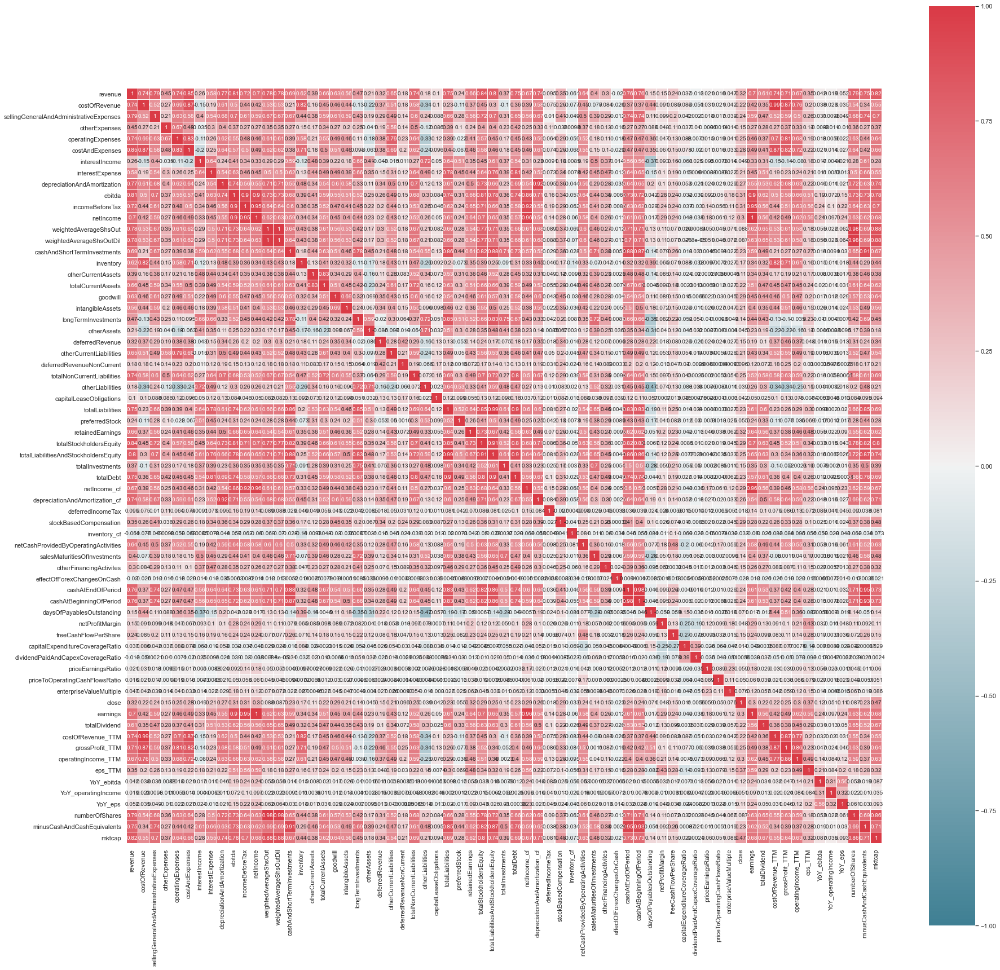

 
-----------------------------------------------------------------------------------------------------------------------------
 
Target_0.15


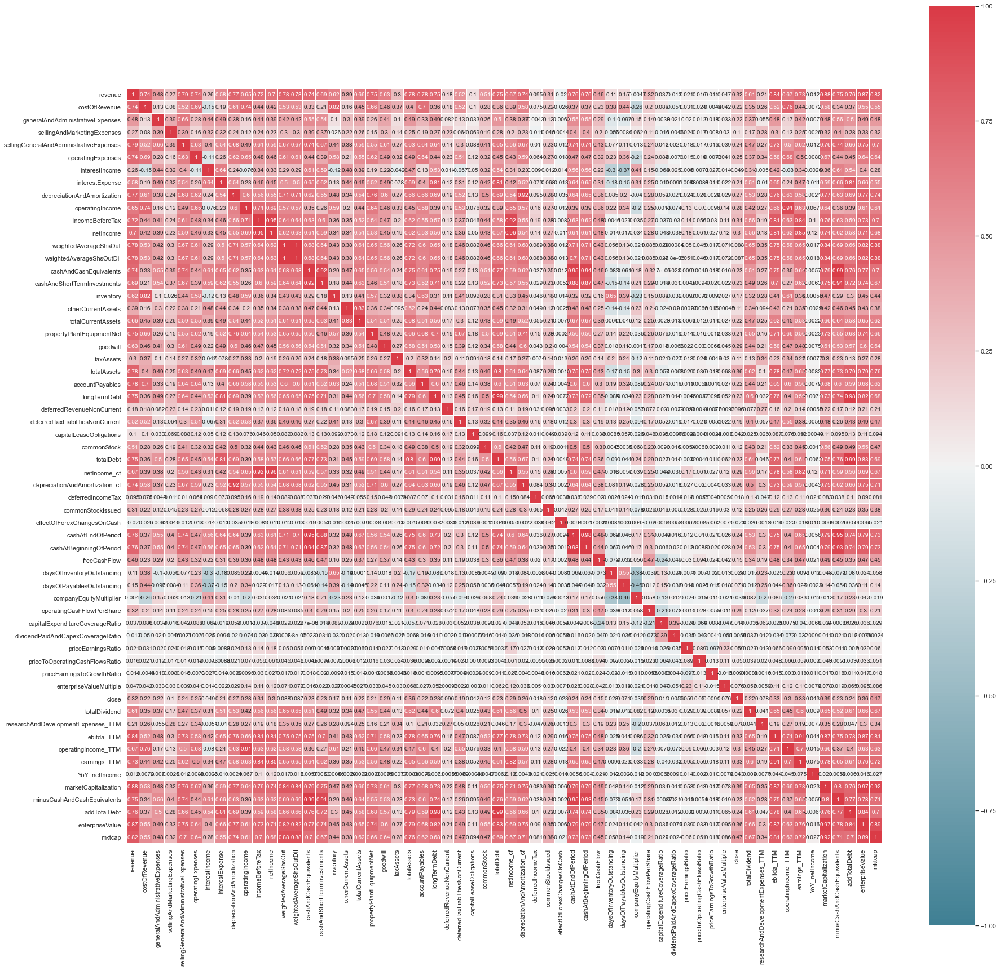

 
-----------------------------------------------------------------------------------------------------------------------------
 


In [13]:
for key in lasso_subset_dict.keys():
    print(key)
    subset = lasso_subset_dict[key]
    cor_heat_map(x_train_out[subset].corr())
    
    print(' ')
    print('-'*125)
    print(' ')

### MI  

Target_0


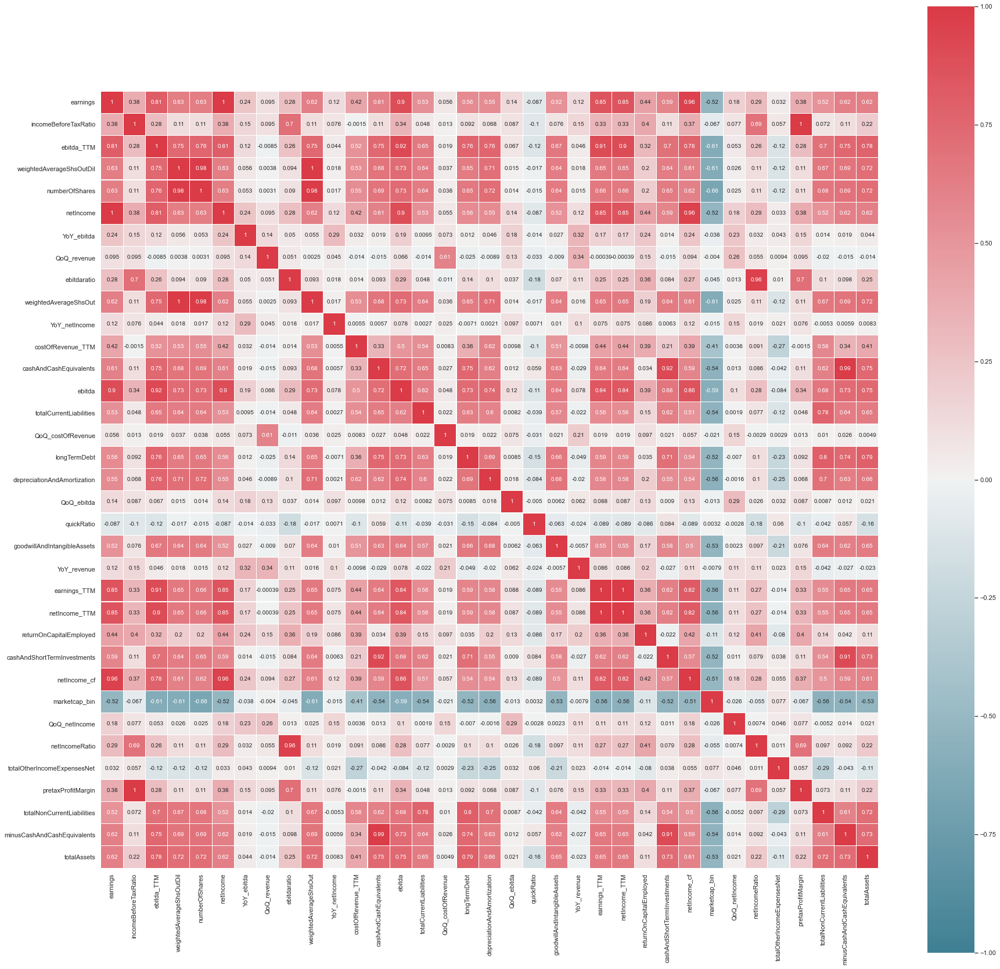

 
-----------------------------------------------------------------------------------------------------------------------------
 
Target_0.15


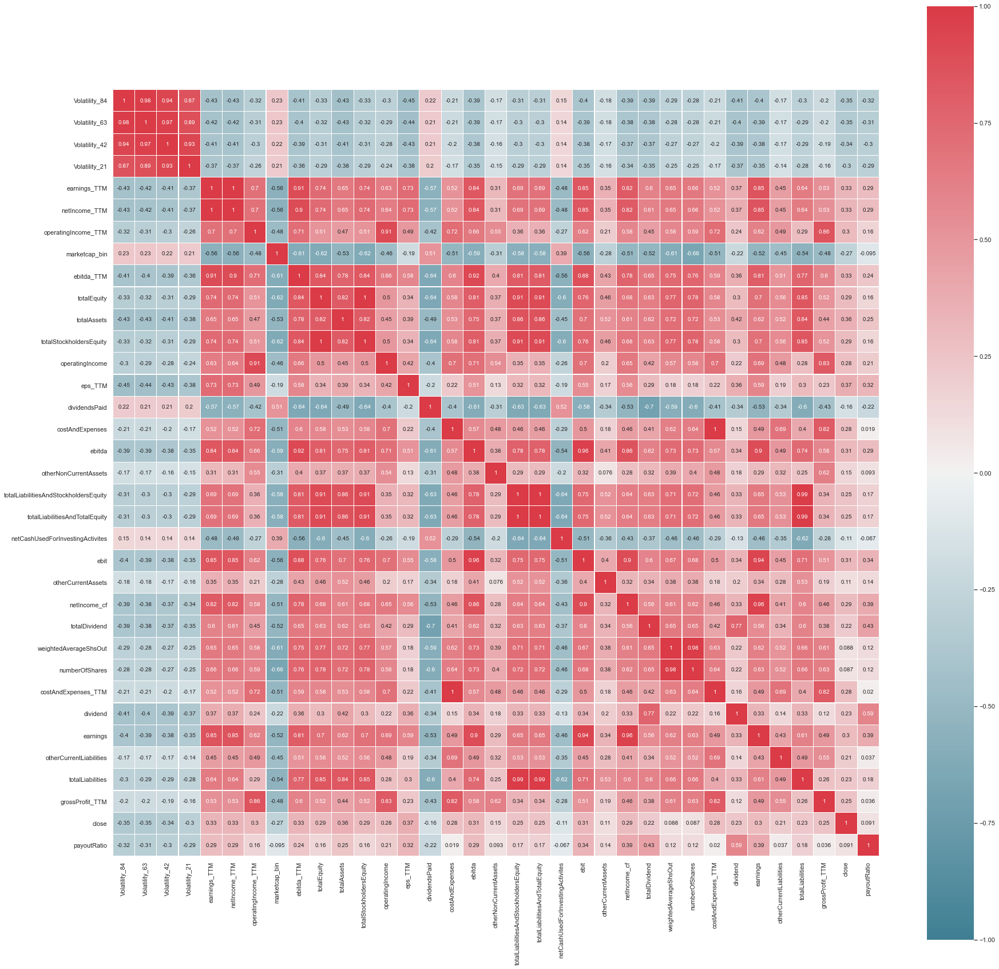

 
-----------------------------------------------------------------------------------------------------------------------------
 


In [14]:
for key in mi_subset_dict.keys():
    print(key)
    subset = mi_subset_dict[key]
    
    cor_heat_map(x_train_out[subset].corr())
    
    print(' ')
    print('-'*125)
    print(' ')

### Subsets before removing highly correlated features

#### Subset Dictionary 

In [36]:
mi_subset_dict = {'Target_0':['numberOfShares', 'weightedAverageShsOut', 'costOfRevenue_TTM',
        'QoQ_costAndExpenses', 'incomeBeforeTaxRatio',
        'goodwillAndIntangibleAssets', 'earnings', 'pretaxProfitMargin',
        'weightedAverageShsOutDil', 'grossProfit', 'incomeBeforeTax',
        'costAndExpenses_TTM', 'ebitda', 'netIncome', 'accountsPayables',
        'fixedAssetTurnover', 'excessReturn_84', 'netIncome_bin',
        'ebtPerEbit', 'netIncome_cf', 'YoY_netIncome',
        'totalOtherIncomeExpensesNet', 'operatingProfitMargin',
        'Volatility_42', 'operatingIncome', 'dividendPayoutRatio',
        'cashAtEndOfPeriod', 'depreciationAndAmortization',
        'cashFlowCoverageRatios', 'purchasesOfInvestments',
        'Volatility_21', 'assetTurnover', 'eps', 'commonStock',
        'payoutRatio'],
        'Target_0.15':['Volatility_84', 'Volatility_42', 'Volatility_63', 'Volatility_21',
        'operatingIncome', 'costAndExpenses_TTM', 'netIncome_bin',
        'dividendPayoutRatio', 'totalDividend', 'dividend',
        'operatingIncome_TTM', 'netIncome_TTM', 'costAndExpenses',
        'grossProfit', 'ebit', 'dividendsPaid', 'earnings_TTM',
        'otherCurrentLiabilities', 'dividendYield',
        'totalStockholdersEquity', 'totalAssets', 'totalEquity',
        'payoutRatio', 'eps_TTM', 'otherNonCurrentAssets',
        'totalLiabilitiesAndTotalEquity', 'ebitda_TTM',
        'otherCurrentAssets', 'grossProfit_TTM', 'marketcap_bin',
        'operatingExpenses', 'totalLiabilitiesAndStockholdersEquity',
        'netCashUsedForInvestingActivites', 'goodwill',
        'totalNonCurrentAssets']}

lasso_subset_dict = {'Target_0':['revenue', 'costOfRevenue', 'sellingGeneralAndAdministrativeExpenses',
        'otherExpenses', 'operatingExpenses', 'costAndExpenses',
        'interestIncome', 'interestExpense', 'depreciationAndAmortization',
        'ebitda', 'incomeBeforeTax', 'netIncome', 'weightedAverageShsOut',
        'weightedAverageShsOutDil', 'cashAndShortTermInvestments', 'inventory',
        'otherCurrentAssets', 'totalCurrentAssets', 'goodwill',
        'intangibleAssets', 'longTermInvestments', 'otherAssets',
        'deferredRevenue', 'otherCurrentLiabilities',
        'deferredRevenueNonCurrent', 'totalNonCurrentLiabilities',
        'otherLiabilities', 'capitalLeaseObligations', 'totalLiabilities',
        'preferredStock', 'retainedEarnings', 'totalStockholdersEquity',
        'totalLiabilitiesAndStockholdersEquity', 'totalInvestments',
        'totalDebt', 'netIncome_cf', 'depreciationAndAmortization_cf',
        'deferredIncomeTax', 'stockBasedCompensation', 'inventory_cf',
        'netCashProvidedByOperatingActivities', 'salesMaturitiesOfInvestments',
        'otherFinancingActivites', 'effectOfForexChangesOnCash',
        'cashAtEndOfPeriod', 'cashAtBeginningOfPeriod',
        'daysOfPayablesOutstanding', 'netProfitMargin', 'freeCashFlowPerShare',
        'capitalExpenditureCoverageRatio', 'dividendPaidAndCapexCoverageRatio',
        'priceEarningsRatio', 'priceToOperatingCashFlowsRatio',
        'enterpriseValueMultiple', 'close', 'earnings', 'totalDividend',
        'costOfRevenue_TTM', 'grossProfit_TTM', 'operatingIncome_TTM',
        'eps_TTM', 'YoY_ebitda', 'YoY_operatingIncome', 'YoY_eps',
        'numberOfShares', 'minusCashAndCashEquivalents', 'mktcap'],
                     
        'Target_0.15':['revenue', 'costOfRevenue', 'generalAndAdministrativeExpenses',
        'sellingAndMarketingExpenses',
        'sellingGeneralAndAdministrativeExpenses', 'operatingExpenses',
        'interestIncome', 'interestExpense', 'depreciationAndAmortization',
        'operatingIncome', 'incomeBeforeTax', 'netIncome',
        'weightedAverageShsOut', 'weightedAverageShsOutDil',
        'cashAndCashEquivalents', 'cashAndShortTermInvestments', 'inventory',
        'otherCurrentAssets', 'totalCurrentAssets', 'propertyPlantEquipmentNet',
        'goodwill', 'taxAssets', 'totalAssets', 'accountPayables',
        'longTermDebt', 'deferredRevenueNonCurrent',
        'deferredTaxLiabilitiesNonCurrent', 'capitalLeaseObligations',
        'commonStock', 'totalDebt', 'netIncome_cf',
        'depreciationAndAmortization_cf', 'deferredIncomeTax',
        'commonStockIssued', 'effectOfForexChangesOnCash', 'cashAtEndOfPeriod',
        'cashAtBeginningOfPeriod', 'freeCashFlow', 'daysOfInventoryOutstanding',
        'daysOfPayablesOutstanding', 'companyEquityMultiplier',
        'operatingCashFlowPerShare', 'capitalExpenditureCoverageRatio',
        'dividendPaidAndCapexCoverageRatio', 'priceEarningsRatio',
        'priceToOperatingCashFlowsRatio', 'priceEarningsToGrowthRatio',
        'enterpriseValueMultiple', 'close', 'totalDividend',
        'researchAndDevelopmentExpenses_TTM', 'ebitda_TTM',
        'operatingIncome_TTM', 'earnings_TTM', 'YoY_netIncome',
        'marketCapitalization', 'minusCashAndCashEquivalents', 'addTotalDebt',
        'enterpriseValue', 'mktcap']}

### Drop Correlated Columns

In [6]:
def genSubset_dict (data,orig_subset_dict, corr=True):
    new_subset_dict_corr = dict()
    for key in orig_subset_dict.keys():
        print(key)
        subset = orig_subset_dict[key]
        subset = dropCorrelatedVariables(data,
                                         subset,
                                         0.85)
        new_subset_dict_corr[key] = subset
        if corr == True:
            cor_heat_map(data[subset].corr())

        print(' ')
        print('-'*125)
        print(' ')
        
    return(new_subset_dict_corr)

def dropCorrelatedVariables (data, subset, thresh):
    
    """""""""""
    Receives:
        pandas dataframe
        list with column names from the dataset - it can be a subset of columns or all columns
        thresh maximum value of absolute correlation allowed
    Calculates correlation matrix and creates a subset of features without absolute correlation above a certain threshold
    
    """""""""""
    corr = data[subset].corr()
    new_subset = []
    for col in subset:
        corr_temp = abs(corr[col]).sort_values(ascending=False).iloc[1:]
        corr_temp = corr_temp[corr_temp>0.85]
        correlated_variables = corr_temp.index
        if len(corr_temp)==0:
            new_subset.append(col)

        if len(corr_temp)>0:
            count_ = 0
            for feature in correlated_variables:
                if feature in new_subset:
                    count_ = count_+1
            if count_==0:
                new_subset.append(col)
                
    return(new_subset)

#### Mutual Information

Target_0


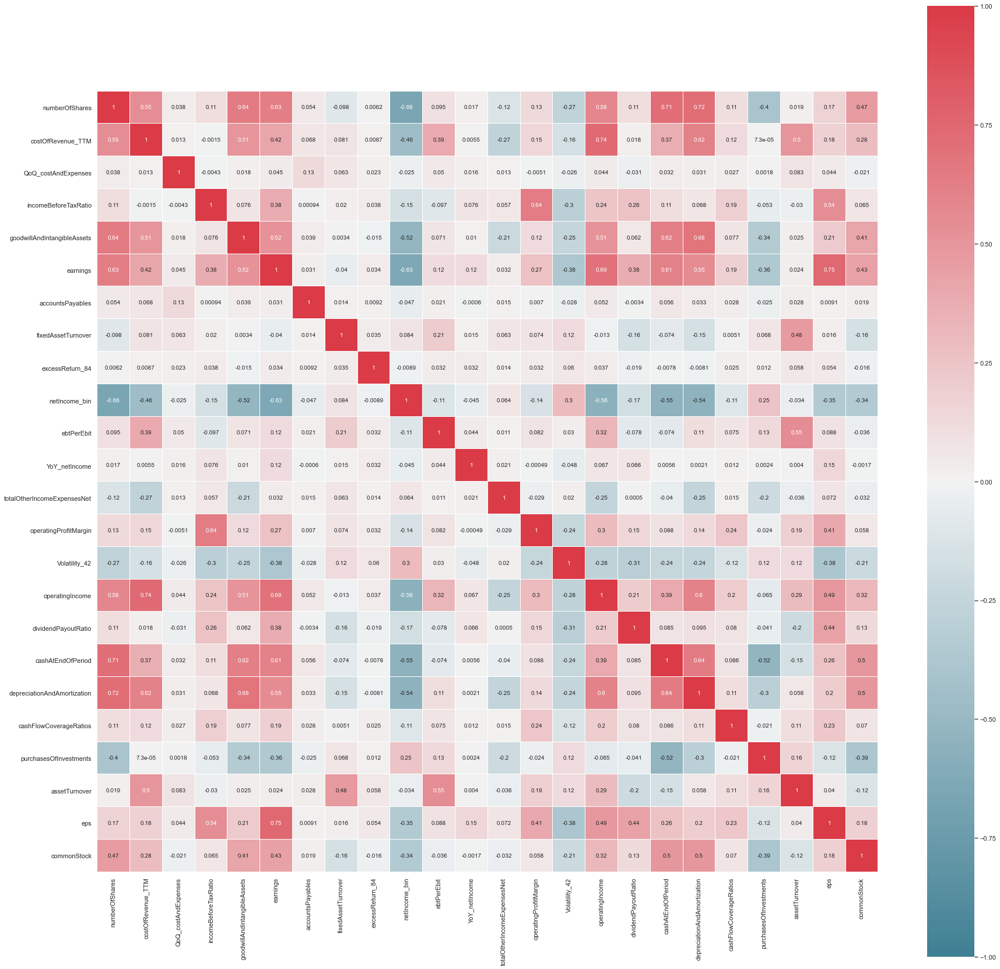

 
-----------------------------------------------------------------------------------------------------------------------------
 
Target_0.15


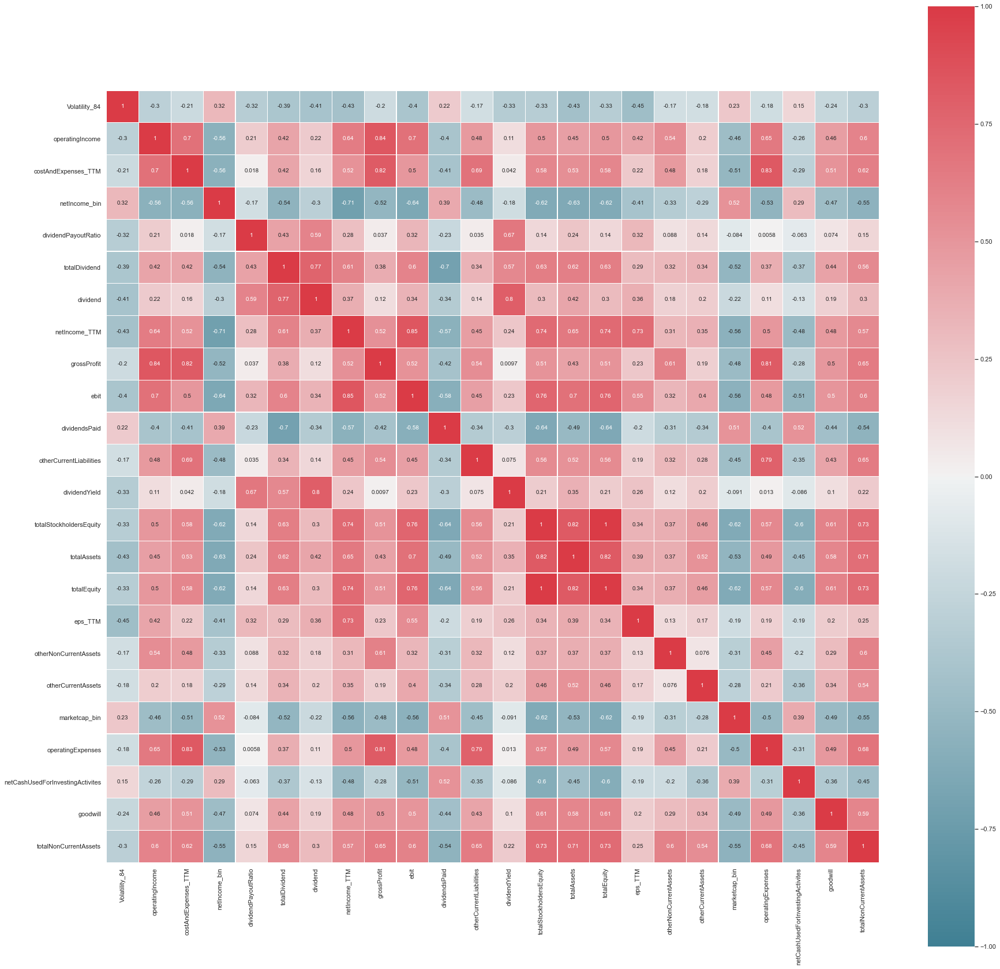

 
-----------------------------------------------------------------------------------------------------------------------------
 


In [34]:
mi_subset_dict_corr = genSubset_dict(x_train_out, mi_subset_dict)

#### Lasso 

Target_0


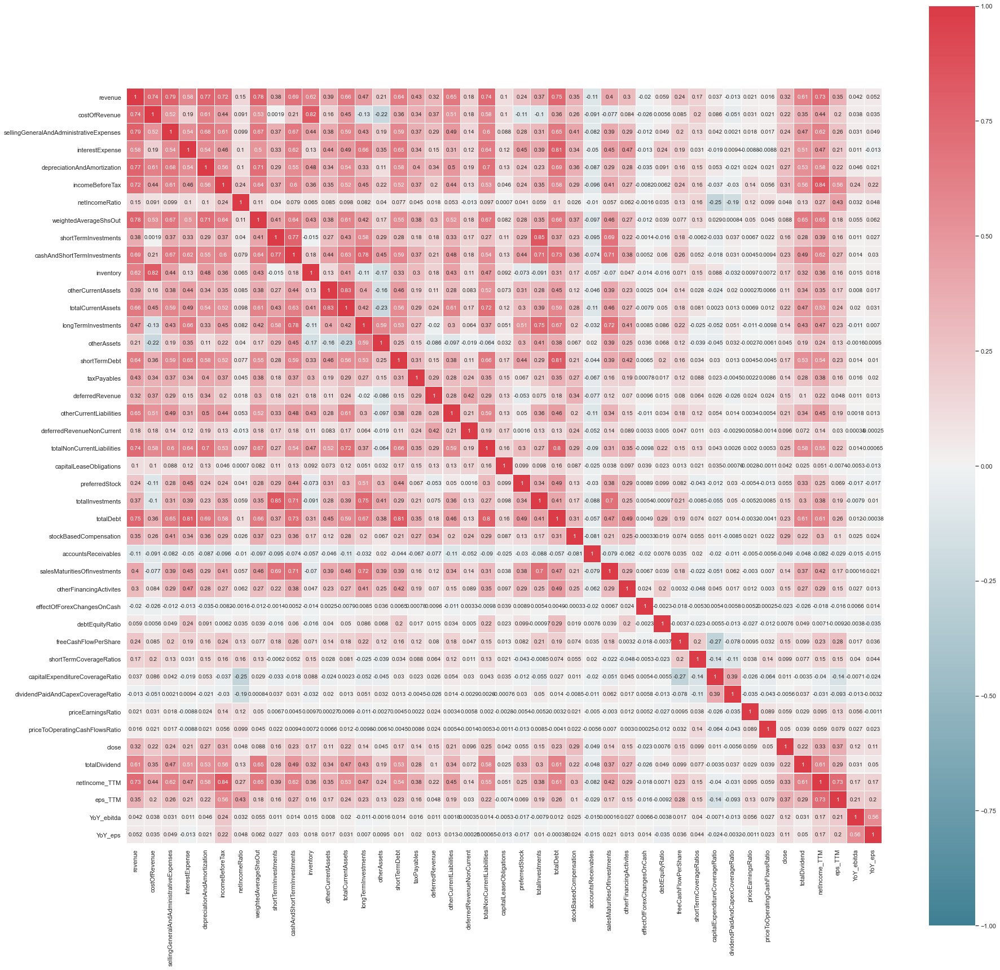

 
-----------------------------------------------------------------------------------------------------------------------------
 
Target_0.15


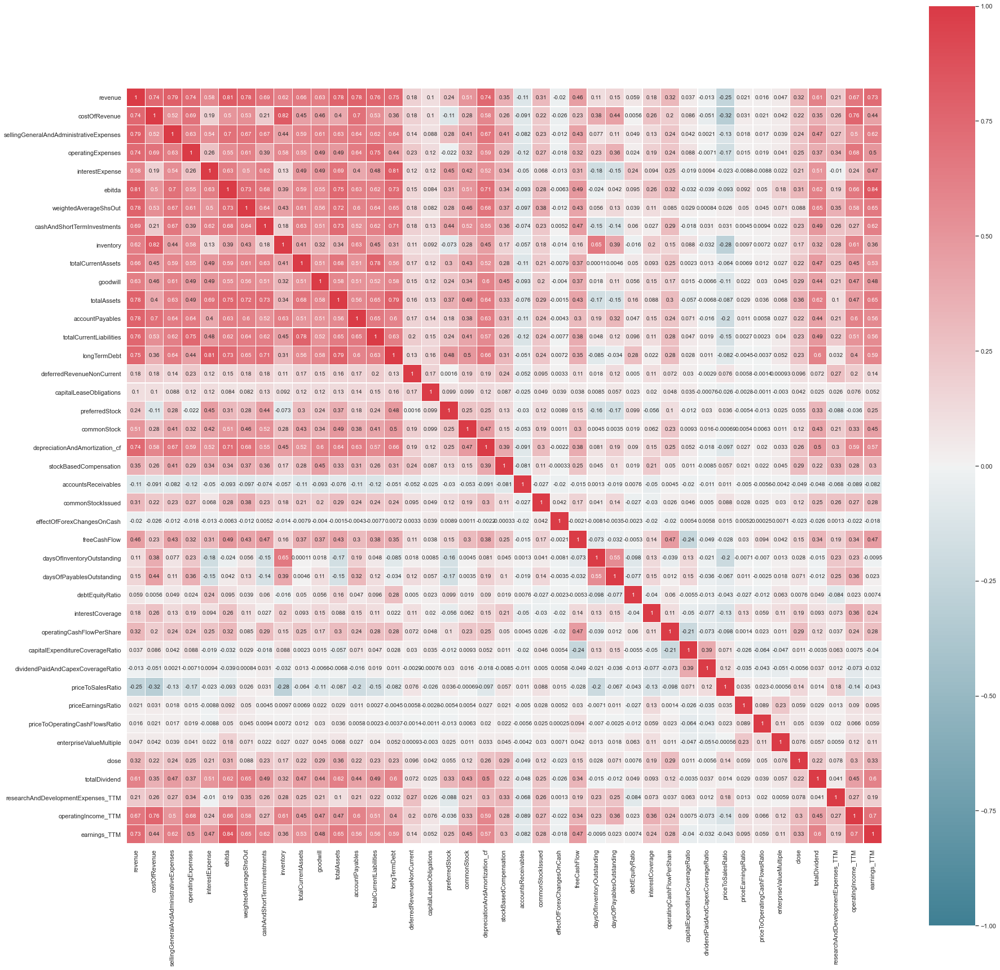

 
-----------------------------------------------------------------------------------------------------------------------------
 


In [18]:
lasso_subset_dict_corr = genSubset_dict(x_train_out, lasso_subset_dict)

In [7]:
print('Mutual Information')
mi_subset_dict_corr = genSubset_dict(x_train,
                                     orig_subset_dict = mi_subset_dict,
                                     corr=False)


print('Lasso')
lasso_subset_dict_corr = genSubset_dict(x_train,
                                        orig_subset_dict = lasso_subset_dict,
                                     corr=False)

Mutual Information
Target_0
 
-----------------------------------------------------------------------------------------------------------------------------
 
Target_0.15
 
-----------------------------------------------------------------------------------------------------------------------------
 
Lasso
Target_0
 
-----------------------------------------------------------------------------------------------------------------------------
 
Target_0.15
 
-----------------------------------------------------------------------------------------------------------------------------
 


### Subsets After Dropping Correlation

In [3]:
mi_subset_dict = {'Target_0':['numberOfShares',
  'costOfRevenue_TTM',
  'QoQ_costAndExpenses',
  'incomeBeforeTaxRatio',
  'goodwillAndIntangibleAssets',
  'earnings',
  'accountsPayables',
  'fixedAssetTurnover',
  'excessReturn_84',
  'netIncome_bin',
  'ebtPerEbit',
  'netIncome_cf',
  'YoY_netIncome',
  'totalOtherIncomeExpensesNet',
  'Volatility_42',
  'operatingIncome',
  'dividendPayoutRatio',
  'cashAtEndOfPeriod',
  'depreciationAndAmortization',
  'cashFlowCoverageRatios',
  'purchasesOfInvestments',
  'assetTurnover',
  'eps',
  'commonStock'],
                  
  'Target_0.15': ['Volatility_84',
  'Volatility_21',
  'operatingIncome',
  'costAndExpenses_TTM',
  'netIncome_bin',
  'dividendPayoutRatio',
  'totalDividend',
  'dividend',
  'netIncome_TTM',
  'dividendsPaid',
  'otherCurrentLiabilities',
  'dividendYield',
  'totalAssets',
  'eps_TTM',
  'otherNonCurrentAssets',
  'totalLiabilitiesAndTotalEquity',
  'otherCurrentAssets',
  'marketcap_bin',
  'netCashUsedForInvestingActivites',
  'goodwill',
  'totalNonCurrentAssets']}

lasso_subset_dict = {'Target_0':['revenue',
  'costOfRevenue',
  'otherExpenses',
  'interestIncome',
  'weightedAverageShsOut',
  'cashAndShortTermInvestments',
  'otherCurrentAssets',
  'totalCurrentAssets',
  'goodwill',
  'intangibleAssets',
  'longTermInvestments',
  'otherAssets',
  'deferredRevenue',
  'otherCurrentLiabilities',
  'deferredRevenueNonCurrent',
  'totalNonCurrentLiabilities',
  'capitalLeaseObligations',
  'preferredStock',
  'totalInvestments',
  'netIncome_cf',
  'depreciationAndAmortization_cf',
  'deferredIncomeTax',
  'stockBasedCompensation',
  'inventory_cf',
  'netCashProvidedByOperatingActivities',
  'salesMaturitiesOfInvestments',
  'otherFinancingActivites',
  'effectOfForexChangesOnCash',
  'daysOfPayablesOutstanding',
  'netProfitMargin',
  'freeCashFlowPerShare',
  'capitalExpenditureCoverageRatio',
  'priceEarningsRatio',
  'close',
  'totalDividend',
  'operatingIncome_TTM',
  'eps_TTM',
  'YoY_ebitda',
  'YoY_operatingIncome',
  'YoY_eps'],
                     
  'Target_0.15':['revenue',
  'costOfRevenue',
  'generalAndAdministrativeExpenses',
  'sellingAndMarketingExpenses',
  'interestIncome',
  'operatingIncome',
  'weightedAverageShsOut',
  'cashAndShortTermInvestments',
  'otherCurrentAssets',
  'totalCurrentAssets',
  'goodwill',
  'taxAssets',
  'totalAssets',
  'accountPayables',
  'longTermDebt',
  'deferredRevenueNonCurrent',
  'deferredTaxLiabilitiesNonCurrent',
  'capitalLeaseObligations',
  'commonStock',
  'netIncome_cf',
  'depreciationAndAmortization_cf',
  'deferredIncomeTax',
  'commonStockIssued',
  'effectOfForexChangesOnCash',
  'freeCashFlow',
  'daysOfInventoryOutstanding',
  'daysOfPayablesOutstanding',
  'companyEquityMultiplier',
  'operatingCashFlowPerShare',
  'capitalExpenditureCoverageRatio',
  'priceEarningsRatio',
  'priceEarningsToGrowthRatio',
  'close',
  'totalDividend',
  'researchAndDevelopmentExpenses_TTM',
  'YoY_netIncome']}

In [10]:
elite_subset_dict = dict()
feature_assess_df = pd.DataFrame()

for key in mi_subset_dict.keys():
    print(f'Target: {key}')
    mi_temp = mi_subset_dict_corr[key]
    lasso_temp = lasso_subset_dict_corr[key]

    
    
    subset_names = ['MI','Lasso']
    subsets = [mi_temp,lasso_temp]
    
    ft_df = get_FeatureImportance(subset_names,subsets).iloc[:25]
    display(ft_df)
    ft_df['Target'] = key
    feature_assess_df = pd.concat([feature_assess_df,
                                   ft_df],
                                  axis=0)
    
    
    elite_subset_dict[key] = ft_df.index
    print(' ')
    print('-'*125)
    print(' ')
    
    
features_path = r'D:\Desktop\Long-Term-Model\Exports\CAPM\FeatureSelection\featureSelection_CAPM.csv'
feature_assess_df.to_csv(features_path)

Target: Target_0


,MI,Lasso,totalCount
netIncome_cf,1,1,2
revenue,0,1,1
YoY_eps,0,1,1
eps_TTM,0,1,1
stockBasedCompensation,0,1,1
deferredIncomeTax,0,1,1
depreciationAndAmortization_cf,0,1,1
totalInvestments,0,1,1
YoY_operatingIncome,0,1,1
YoY_netIncome,1,0,1


 
-----------------------------------------------------------------------------------------------------------------------------
 
Target: Target_0.15


,MI,Lasso,totalCount
totalDividend,1,1,2
totalAssets,1,1,2
goodwill,1,1,2
otherCurrentAssets,1,1,2
operatingIncome,1,1,2
revenue,0,1,1
capitalLeaseObligations,0,1,1
totalLiabilitiesAndTotalEquity,1,0,1
researchAndDevelopmentExpenses_TTM,0,1,1
costAndExpenses_TTM,1,0,1


 
-----------------------------------------------------------------------------------------------------------------------------
 


### Target Correlation

#### Data with outlier treatment

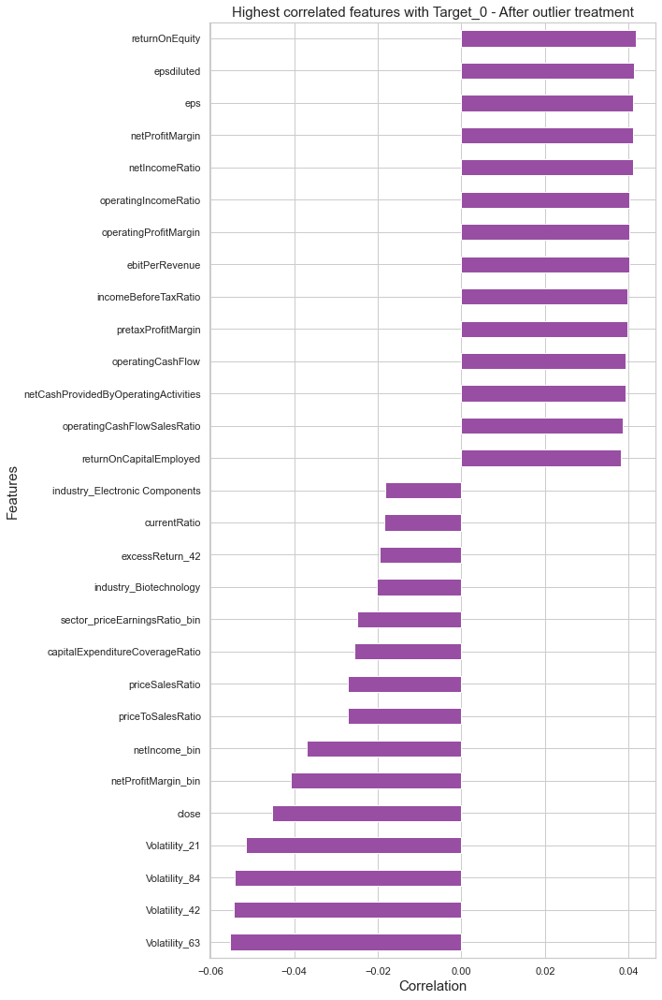

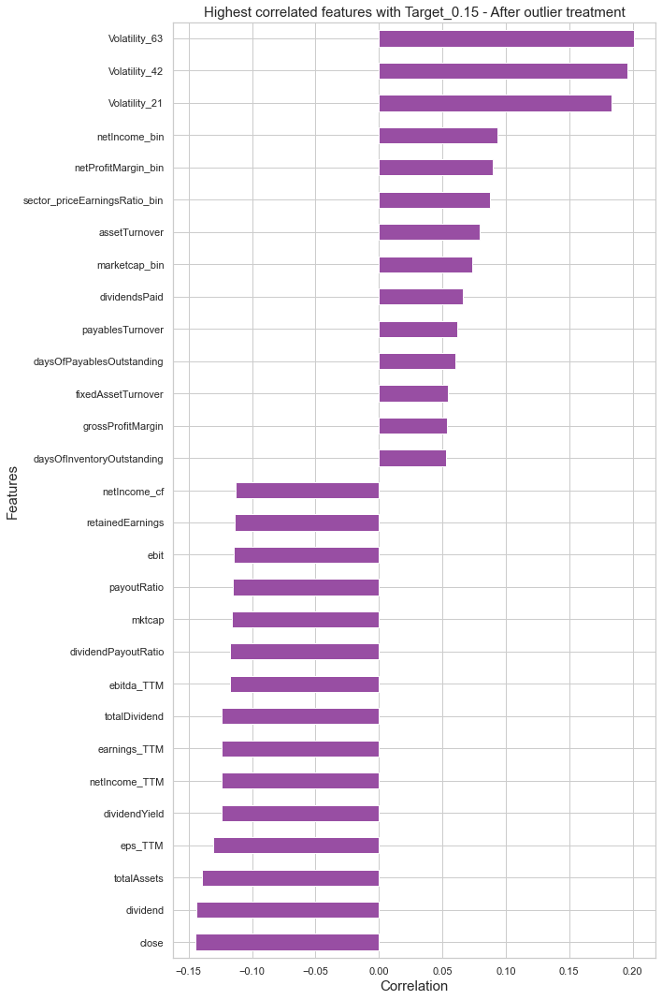

In [20]:
path =r'D:\Desktop\Long-Term-Model\Exports\CAPM\Target_Correlation'
for key in y_train_dict.keys():
    df_corr = pd.concat([x_train_out,
                         y_train_dict[key]],
                        axis=1)
    full_corr = df_corr.corr()
    target_corr = full_corr.iloc[:,-1].sort_values(ascending=False).dropna().iloc[1:]

    least_corr = target_corr.iloc[-15:]
    most_corr = target_corr.iloc[1:15]
    full_corr = pd.concat([least_corr,
                           most_corr],
                          axis=0).sort_values()
    title = f'Highest correlated features with {key} - After outlier treatment'
    full_corr.plot.barh(figsize = (10,15),color = palette[3])
    plt.title(title, size = 15)
    plt.xlabel('Correlation',size = 15)
    plt.ylabel('Features',size = 15)
    
    plt.tight_layout()

    name_plot = f'{path}\\{title}.png'
    plt.savefig(name_plot, dpi=300)
    plt.show()

#### Data without outlier treatment

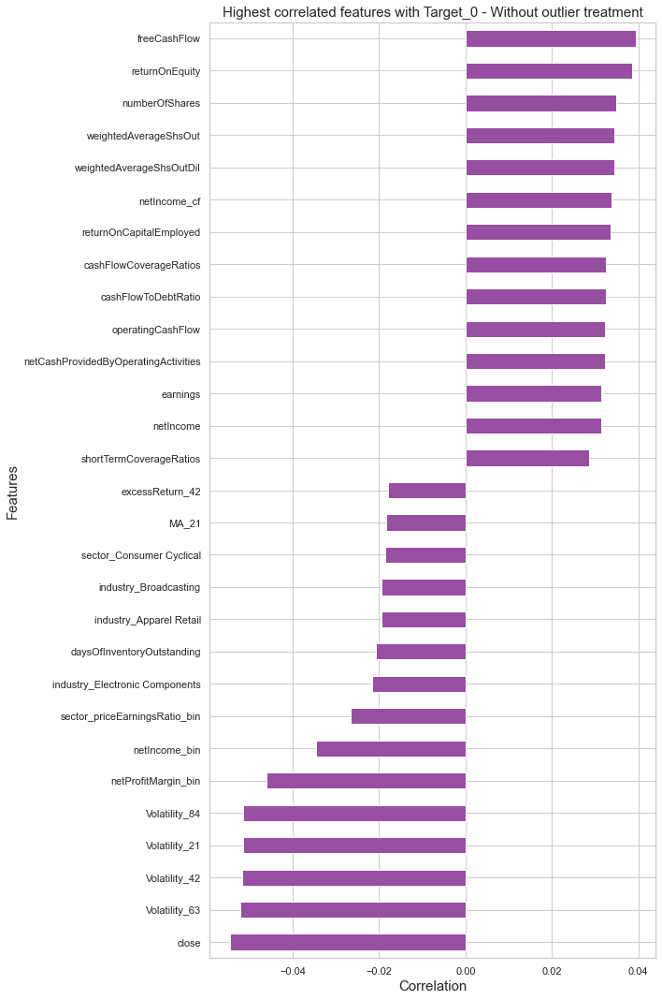

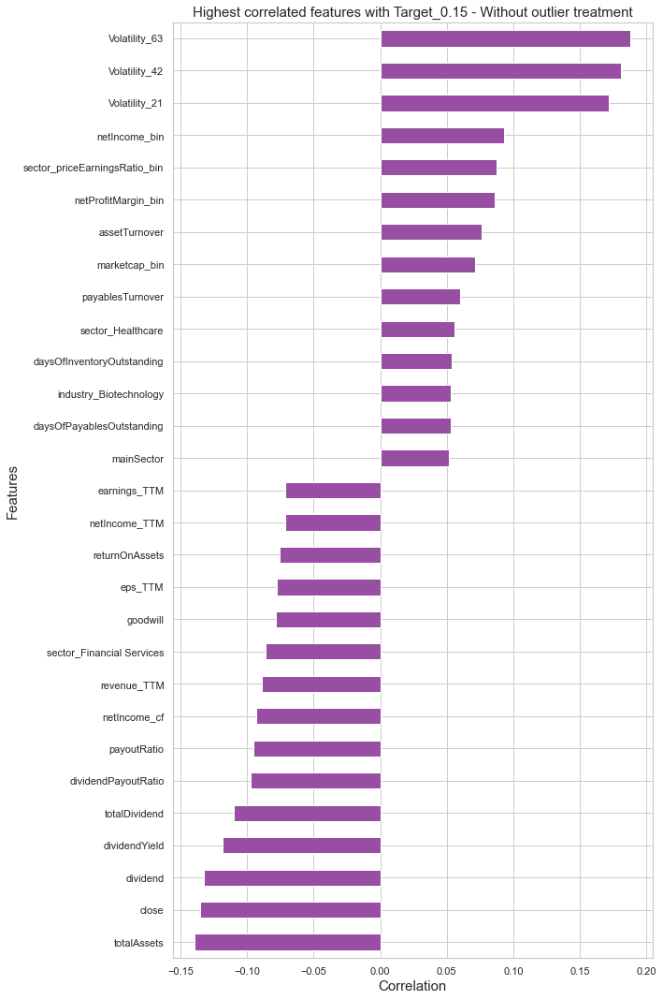

In [21]:
path =r'D:\Desktop\Long-Term-Model\Exports\CAPM\Target_Correlation'
for key in y_train_dict.keys():
    df_corr = pd.concat([x_train,
                         y_train_dict[key]],
                        axis=1)
    full_corr = df_corr.sample(30000).corr()
    target_corr = full_corr.iloc[:,-1].sort_values(ascending=False).dropna().iloc[1:]

    least_corr = target_corr.iloc[-15:]
    most_corr = target_corr.iloc[1:15]
    full_corr = pd.concat([least_corr,
                           most_corr],
                          axis=0).sort_values()
    title = f'Highest correlated features with {key} - Without outlier treatment'
    full_corr.plot.barh(figsize = (10,15),color = palette[3])
    plt.title(title, size = 15)
    plt.xlabel('Correlation',size = 15)
    plt.ylabel('Features',size = 15)
    plt.tight_layout()

    name_plot = f'{path}\\{title}.png'
    plt.savefig(name_plot, dpi=300)
    plt.show()

#### __Correlation subset__

#### __Target 0__

In [15]:
df_corr = pd.concat([x_train_out,
                        y_train_dict['Target_0']],
                    axis=1)
full_corr = df_corr.corr()
target_corr = full_corr.iloc[:,-1].sort_values(ascending=False).dropna().iloc[1:]

least_corr = target_corr.iloc[-15:]
most_corr = target_corr.iloc[1:15]

full_corr = pd.concat([least_corr,
                           most_corr],
                          axis=0).sort_values()

print(full_corr.index)

Index(['Volatility_63', 'Volatility_42', 'Volatility_84', 'Volatility_21',
       'close', 'netProfitMargin_bin', 'netIncome_bin', 'priceToSalesRatio',
       'priceSalesRatio', 'capitalExpenditureCoverageRatio',
       'sector_priceEarningsRatio_bin', 'industry_Biotechnology',
       'excessReturn_42', 'currentRatio', 'industry_Electronic Components',
       'returnOnCapitalEmployed', 'operatingCashFlowSalesRatio',
       'netCashProvidedByOperatingActivities', 'operatingCashFlow',
       'pretaxProfitMargin', 'incomeBeforeTaxRatio', 'ebitPerRevenue',
       'operatingProfitMargin', 'operatingIncomeRatio', 'netIncomeRatio',
       'netProfitMargin', 'eps', 'epsdiluted', 'returnOnEquity'],
      dtype='object')


### __Target 15__

In [16]:
df_corr = pd.concat([x_train_out,
                        y_train_dict['Target_0.15']],
                    axis=1)
full_corr = df_corr.corr()
target_corr = full_corr.iloc[:,-1].sort_values(ascending=False).dropna().iloc[1:]

least_corr = target_corr.iloc[-15:]
most_corr = target_corr.iloc[1:15]

full_corr = pd.concat([least_corr,
                           most_corr],
                          axis=0).sort_values()

print(full_corr.index)

Index(['close', 'dividend', 'totalAssets', 'eps_TTM', 'dividendYield',
       'netIncome_TTM', 'earnings_TTM', 'totalDividend', 'ebitda_TTM',
       'dividendPayoutRatio', 'mktcap', 'payoutRatio', 'ebit',
       'retainedEarnings', 'netIncome_cf', 'daysOfInventoryOutstanding',
       'grossProfitMargin', 'fixedAssetTurnover', 'daysOfPayablesOutstanding',
       'payablesTurnover', 'dividendsPaid', 'marketcap_bin', 'assetTurnover',
       'sector_priceEarningsRatio_bin', 'netProfitMargin_bin', 'netIncome_bin',
       'Volatility_21', 'Volatility_42', 'Volatility_63'],
      dtype='object')


### Compare subset perfomance

To comparethe perfomance of different subsets, each subset was used to train a model on the original set of data, without outlier tratment and on the data that went through an outlier tratment.  Regarding Target 0,  with outlier treatment, it's clear that Lasso outperformed the MI subset considering accuracy as key metrics at this stage. When looking at Target 15, Lasso outperformed MI regarding AUC with a huge margin, this is due to the fact that the Lasso produces a much higher recall when compared to the MI.

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, StackingClassifier


#### With Outlier Treatment

In [21]:
subsetAssess_df = pd.DataFrame()
for key in mi_subset_dict_corr.keys():
    print(key)
    subset_names = ['MI','Lasso']
    subsets = [mi_subset_dict_corr[key],
               lasso_subset_dict_corr[key]]
    
    if key =='Target_0':
        class_weight = None
        
    else:
        class_weight = 'balanced'
    model = LogisticRegression(
                               class_weight=class_weight,
                               random_state=0)
    
    
    for subset, name in zip(subsets,subset_names):
        print('Subset:')
        print(name)
        subset_returns = class_cv.validateModel(x_train_out[[*subset]],
                      y_train_dict[key],
                      model=model ,
                      scaler=False,
                        over_sampling=False,
                        predictions=False,
                        cv_type='stratKfold',
                        scaler_type='stand',
                        train_size=10,
                        test_size=1,
                        gap=0)
        assess_returns = subset_returns['scores']
        assess_returns['subset'] = name
        assess_returns['Target'] = key
        subsetAssess_df = pd.concat([subsetAssess_df,
                                     assess_returns],
                                    axis=0)
        print(' ')
        print('-'*125)
        print(' ')

Target_0
Subset:
MI
stratKfold
Nr of splits: 10
accuracy_train     0.512717
f1_train           0.629801
recall_train       0.800122
precision_train    0.519283
auc_train          0.501940
accuracy_test      0.512840
f1_test            0.629377
recall_test        0.800360
precision_test     0.519243
auc_test           0.502052
dtype: float64
 
-----------------------------------------------------------------------------------------------------------------------------
 
Subset:
Lasso
stratKfold
Nr of splits: 10
accuracy_train     0.538516
f1_train           0.615754
recall_train       0.713771
precision_train    0.541437
auc_train          0.531944
accuracy_test      0.528857
f1_test            0.606118
recall_test        0.701189
precision_test     0.534791
auc_test           0.522389
dtype: float64
 
-----------------------------------------------------------------------------------------------------------------------------
 
Target_0.15
Subset:
MI
stratKfold
Nr of splits: 10
accuracy_

#### Final Subsets

__Target_0:__  Lasso
- The threshold in this Target is 0, making it very important to not have False Positive which would lead to undeperforming investment.  
- Precision is specially important for this Target

__Target 0.15:__ Lasso
- Presents higher AUC and Precision when compared to the MI Subset

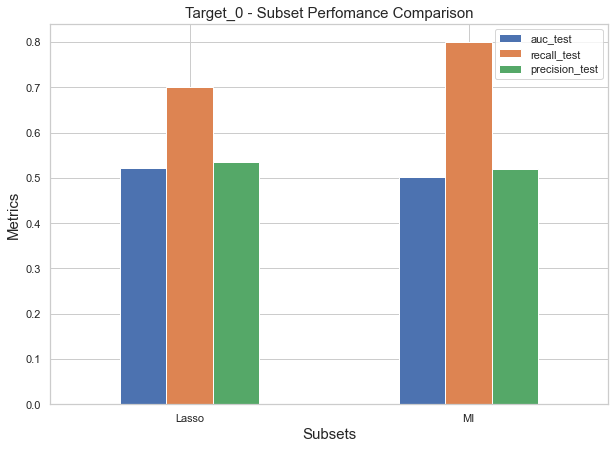

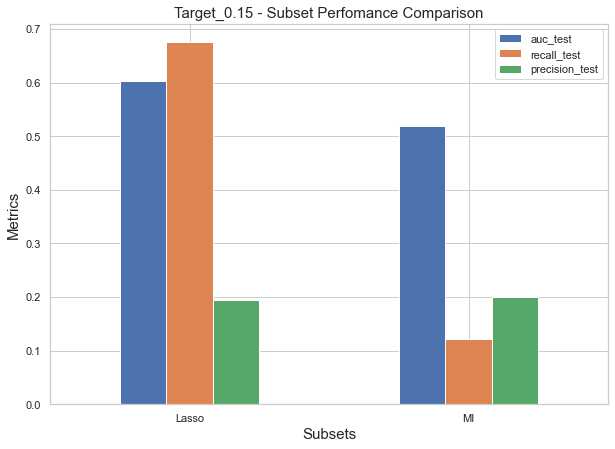

In [24]:
for target in subsetAssess_df.reset_index().Target.unique():
    query = subsetAssess_df['Target'] == target
    subsetAssess_df.loc[query].groupby('subset').mean()[['auc_test','recall_test','precision_test']].sort_values('auc_test',ascending=False).plot.bar(figsize = (10,7))
    plt.xticks(rotation=0)
    plt.title(f'{target} - Subset Perfomance Comparison',size = 15)

    plt.xlabel('Subsets',size= 15)
    plt.ylabel('Metrics',size = 15)

In [25]:
subset_perfomance = subsetAssess_df.groupby(['Target','subset']).mean()
perfomance_path = r'D:\Desktop\Long-Term-Model\Exports\CAPM\FeatureSelection\FeatureSelectionPerfomance_CAPM.csv'
subset_perfomance.to_csv(perfomance_path)

#### Final Subsets

In [5]:
lasso_subset_0 = ['revenue',
 'costOfRevenue',
 'otherExpenses',
 'interestIncome',
 'weightedAverageShsOut',
 'cashAndShortTermInvestments',
 'otherCurrentAssets',
 'totalCurrentAssets',
 'goodwill',
 'intangibleAssets',
 'longTermInvestments',
 'otherAssets',
 'deferredRevenue',
 'otherCurrentLiabilities',
 'deferredRevenueNonCurrent',
 'totalNonCurrentLiabilities',
 'capitalLeaseObligations',
 'preferredStock',
 'totalInvestments',
 'netIncome_cf',
 'depreciationAndAmortization_cf',
 'deferredIncomeTax',
 'stockBasedCompensation',
 'inventory_cf',
 'netCashProvidedByOperatingActivities',
 'salesMaturitiesOfInvestments',
 'otherFinancingActivites',
 'effectOfForexChangesOnCash',
 'daysOfPayablesOutstanding',
 'netProfitMargin',
 'freeCashFlowPerShare',
 'capitalExpenditureCoverageRatio',
 'priceEarningsRatio',
 'close',
 'totalDividend',
 'operatingIncome_TTM',
 'eps_TTM',
 'YoY_ebitda',
 'YoY_operatingIncome',
 'YoY_eps']
lasso_subset_15 =  ['revenue',
 'costOfRevenue',
 'generalAndAdministrativeExpenses',
 'sellingAndMarketingExpenses',
 'interestIncome',
 'operatingIncome',
 'weightedAverageShsOut',
 'cashAndShortTermInvestments',
 'otherCurrentAssets',
 'totalCurrentAssets',
 'goodwill',
 'taxAssets',
 'totalAssets',
 'accountPayables',
 'longTermDebt',
 'deferredRevenueNonCurrent',
 'deferredTaxLiabilitiesNonCurrent',
 'capitalLeaseObligations',
 'commonStock',
 'netIncome_cf',
 'depreciationAndAmortization_cf',
 'deferredIncomeTax',
 'commonStockIssued',
 'effectOfForexChangesOnCash',
 'freeCashFlow',
 'daysOfInventoryOutstanding',
 'daysOfPayablesOutstanding',
 'companyEquityMultiplier',
 'operatingCashFlowPerShare',
 'capitalExpenditureCoverageRatio',
 'priceEarningsRatio',
 'priceEarningsToGrowthRatio',
 'close',
 'totalDividend',
 'researchAndDevelopmentExpenses_TTM',
 'YoY_netIncome']


mi_subset_0 =  ['numberOfShares',
  'costOfRevenue_TTM',
  'QoQ_costAndExpenses',
  'incomeBeforeTaxRatio',
  'goodwillAndIntangibleAssets',
  'earnings',
  'accountsPayables',
  'fixedAssetTurnover',
  'excessReturn_84',
  'netIncome_bin',
  'ebtPerEbit',
  'netIncome_cf',
  'YoY_netIncome',
  'totalOtherIncomeExpensesNet',
  'Volatility_42',
  'operatingIncome',
  'dividendPayoutRatio',
  'cashAtEndOfPeriod',
  'depreciationAndAmortization',
  'cashFlowCoverageRatios',
  'purchasesOfInvestments',
  'assetTurnover',
  'eps',
  'commonStock']

mi_subset_15 = ['Volatility_84','Volatility_21','operatingIncome','costAndExpenses_TTM','netIncome_bin',
  'dividendPayoutRatio',
  'totalDividend',
  'dividend',
  'netIncome_TTM',
  'dividendsPaid',
  'otherCurrentLiabilities',
  'dividendYield',
  'totalAssets',
  'eps_TTM',
  'otherNonCurrentAssets',
  'totalLiabilitiesAndTotalEquity',
  'otherCurrentAssets',
  'marketcap_bin',
  'netCashUsedForInvestingActivites',
  'goodwill',
  'totalNonCurrentAssets']

lgb_subset = ['Volatility_84', 'close', 'MA_21', 'Volatility_21', 'YoY_revenue',
       'priceEarningsRatio', 'priceToSalesRatio', 'Volatility_42', 'goodwill',
       'retainedEarnings', 'Volatility_63', 'QoQ_ebitda',
       'otherInvestingActivites', 'excessReturn_21',
       'accumulatedOtherComprehensiveIncomeLoss', 'priceEarningsToGrowthRatio',
       'othertotalStockholdersEquity', 'MA_84', 'payoutRatio',
       'accountsPayables']


corr_subset0 = ['Volatility_63', 'Volatility_42', 'Volatility_84', 'Volatility_21',
       'close', 'netProfitMargin_bin', 'netIncome_bin', 'priceToSalesRatio',
       'priceSalesRatio', 'capitalExpenditureCoverageRatio',
       'sector_priceEarningsRatio_bin', 'industry_Biotechnology',
       'excessReturn_42', 'currentRatio', 'industry_Electronic Components',
       'returnOnCapitalEmployed', 'operatingCashFlowSalesRatio',
       'netCashProvidedByOperatingActivities', 'operatingCashFlow',
       'pretaxProfitMargin', 'incomeBeforeTaxRatio', 'ebitPerRevenue',
       'operatingProfitMargin', 'operatingIncomeRatio', 'netIncomeRatio',
       'netProfitMargin', 'eps', 'epsdiluted', 'returnOnEquity']

corr_subset15 = ['close', 'dividend', 'totalAssets', 'eps_TTM', 'dividendYield',
       'netIncome_TTM', 'earnings_TTM', 'totalDividend', 'ebitda_TTM',
       'dividendPayoutRatio', 'mktcap', 'payoutRatio', 'ebit',
       'retainedEarnings', 'netIncome_cf', 'daysOfInventoryOutstanding',
       'grossProfitMargin', 'fixedAssetTurnover', 'daysOfPayablesOutstanding',
       'payablesTurnover', 'dividendsPaid', 'marketcap_bin', 'assetTurnover',
       'sector_priceEarningsRatio_bin', 'netProfitMargin_bin', 'netIncome_bin',
       'Volatility_21', 'Volatility_42', 'Volatility_63']


### Compare Subset Perfomance - Including Correlated and LGB subset

In [16]:
subsetAssess_df = pd.DataFrame()
for key in mi_subset_dict.keys():
    print(key)
    subset_names = ['MI','Lasso','Correlation0','Correlation15','LGB']
    subsets = [mi_subset_dict[key],
               lasso_subset_dict[key],
               corr_subset0,corr_subset15, lgb_subset]
    
    if key =='Target_0':
        class_weight = None
        
    else:
        class_weight = 'balanced'
    
    model = DecisionTreeClassifier(
                               class_weight=class_weight,max_depth=4,
                               random_state=0)
    
    
    for subset, name in zip(subsets,subset_names):
        print('Subset:')
        print(name)
        subset_returns = class_cv.validateModel(x_train_out.fillna(0)[[*subset]],
                      y_train_dict[key],
                      model=model ,
                      scaler=False,
                        over_sampling=False,
                        predictions=False,
                        cv_type='stratKfold',
                        scaler_type='stand',
                        train_size=10,
                        test_size=1,
                        gap=0)
        assess_returns = subset_returns['scores']
        assess_returns['subset'] = name
        assess_returns['Target'] = key
        subsetAssess_df = pd.concat([subsetAssess_df,
                                     assess_returns],
                                    axis=0)
        print(' ')
        print('-'*125)
        print(' ')

Target_0
Subset:
MI
stratKfold
Nr of splits: 10
accuracy_train     0.539120
f1_train           0.614755
recall_train       0.717006
precision_train    0.542610
auc_train          0.532449
accuracy_test      0.524596
f1_test            0.604339
recall_test        0.704499
precision_test     0.531992
auc_test           0.517851
dtype: float64
 
-----------------------------------------------------------------------------------------------------------------------------
 
Subset:
Lasso
stratKfold
Nr of splits: 10
accuracy_train     0.545243
f1_train           0.595354
recall_train       0.652506
precision_train    0.552569
auc_train          0.541222
accuracy_test      0.528381
f1_test            0.576987
recall_test        0.629452
precision_test     0.539257
auc_test           0.524595
dtype: float64
 
-----------------------------------------------------------------------------------------------------------------------------
 
Subset:
Correlation0
stratKfold
Nr of splits: 10
accuracy_tr

### Export Information

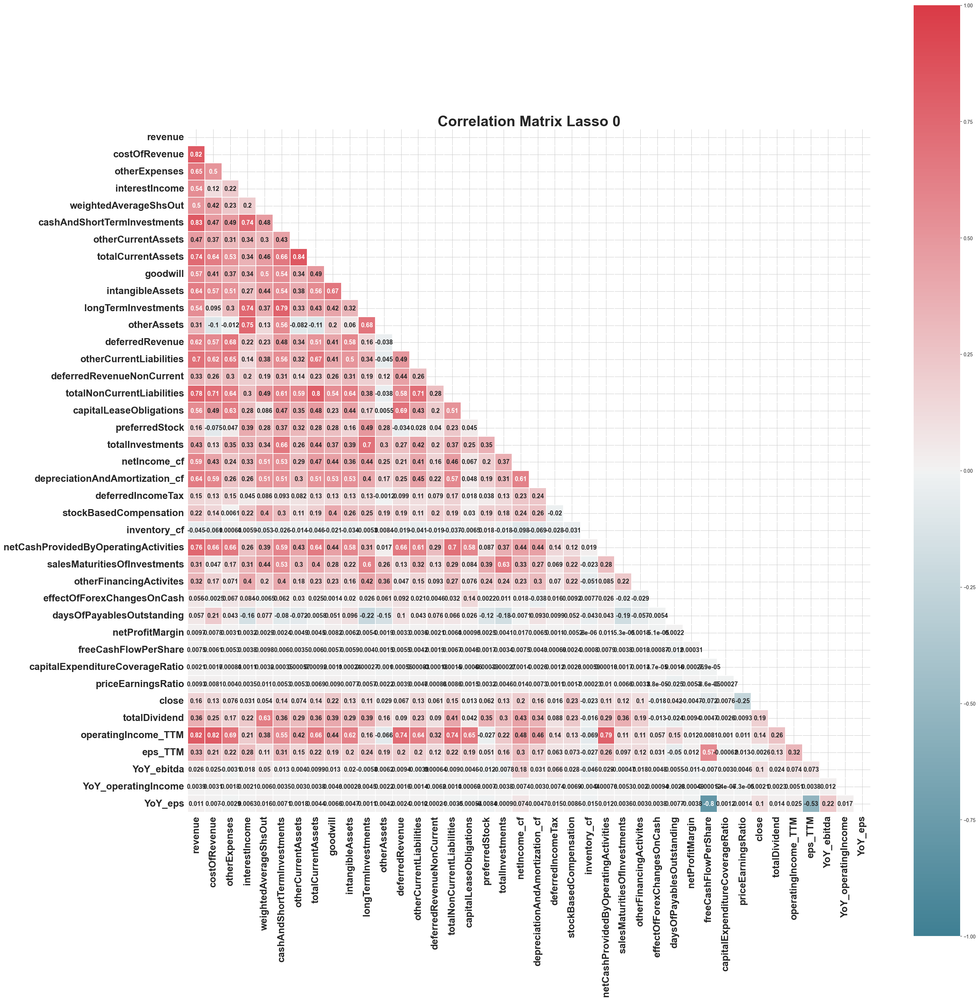

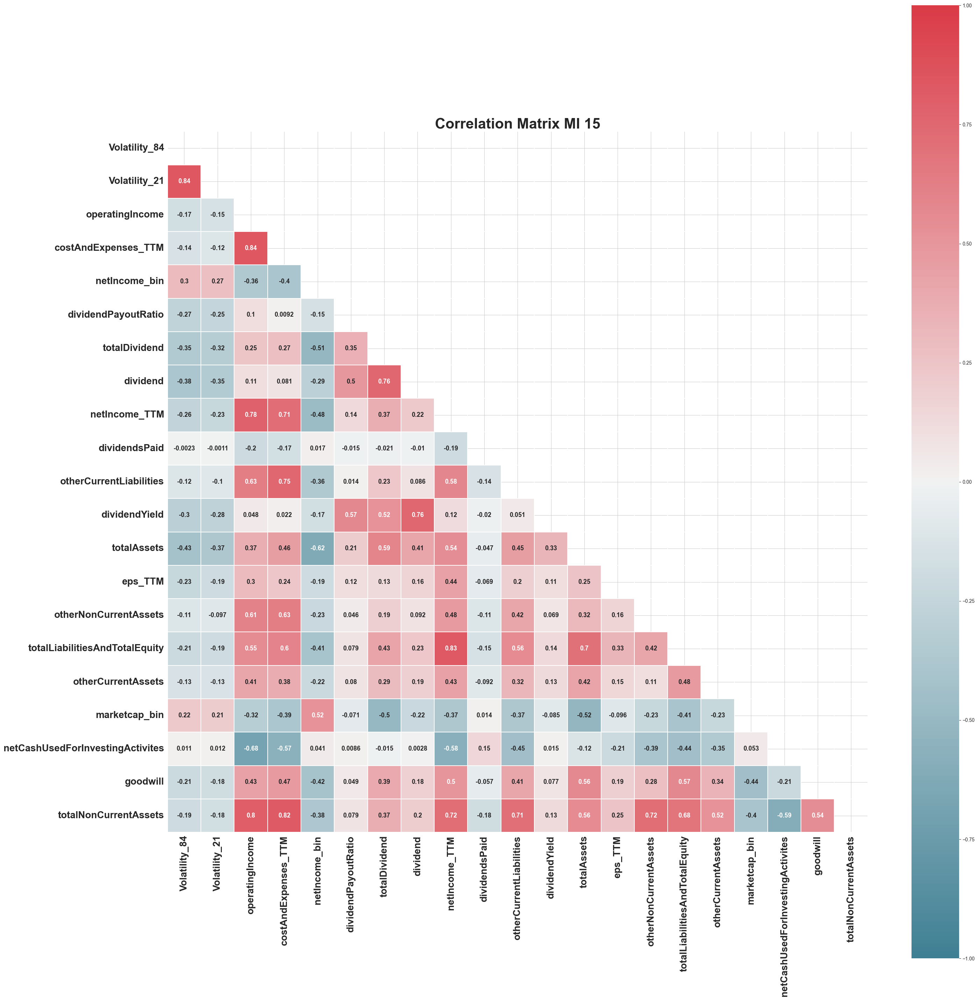

In [21]:
def gen_SubsetDf (subset_list, subset_names):
    subsetDF = pd.DataFrame(index = x_train.columns, columns = subset_names)
    for subset, names in zip(subset_list, subset_names):
        subsetDF.loc[subset, names] = 1
        # subsetDF[names] = subset
    subsetDF.fillna(0, inplace = True)
    subsetDF['total'] = subsetDF.sum(axis = 1)
    subsetDF = subsetDF.loc[subsetDF['total'] >0].drop(columns = 'total')
    return subsetDF

subset_lasso = [lasso_subset_0, lasso_subset_15]
lasso_names = ['Lasso 0', 'Lasso 15']
subset_mi = [mi_subset_0, mi_subset_15]
mi_names = ['MI 0', 'MI 15']

subsetDF_lasso = gen_SubsetDf(subset_lasso, lasso_names)
subsetDF_mi = gen_SubsetDf(subset_mi, mi_names)

subset_path = r'D:\Utilitários\Facul\Mestrado\2o Ano\Research\Thesis\Tables\FeatureSelection\\'

# subsetDF_lasso.to_csv(subset_path + 'subsetDF_lasso.csv')
# subsetDF_mi.to_csv(subset_path + '\subsetDF_mi.csv')


def cor_heat_map_half (corr,titie = 'Correlation Matrix'):
    """""""""""""""""""""
    Receives 
        correlation matrix in pandas df format 
        
    Plots Correlation matrix
    
    """""""""""""""""""""
    
    corr = corr 
    mask = np.triu(np.ones_like(corr, dtype=bool))
    
    plt.figure(figsize = (30, 30))
    sns.heatmap(corr, vmax = 1, vmin=-1, linewidths = 0.1,
               annot = True, annot_kws = {"size": 13, 'weight':'bold'}, square = True, \
                cmap=sns.diverging_palette(220, 10, as_cmap=True),
                mask = mask)
    plt.title(titie, size = 30, weight = 'bold')
    plt.yticks(size = 20, weight='bold')
    plt.xticks(size = 20, weight='bold')
    plt.tight_layout()
    return(plt)
    plt.show()
  
  
corrPath = r'D:\Thesis Reseearch\Asset Allocation - Clean\Asset-Allocation\Long-Term-CAPM\Exports\Correlation\\'

for subset, names in zip([lasso_subset_0,mi_subset_15],
                         ['Lasso 0', 'MI 15']):
    title = 'Correlation Matrix ' + names
    plot = cor_heat_map_half(x_train[subset].corr(), titie = title)
    figpath = f'{corrPath}{title}.png'
    plt.savefig(figpath, dpi = 600)

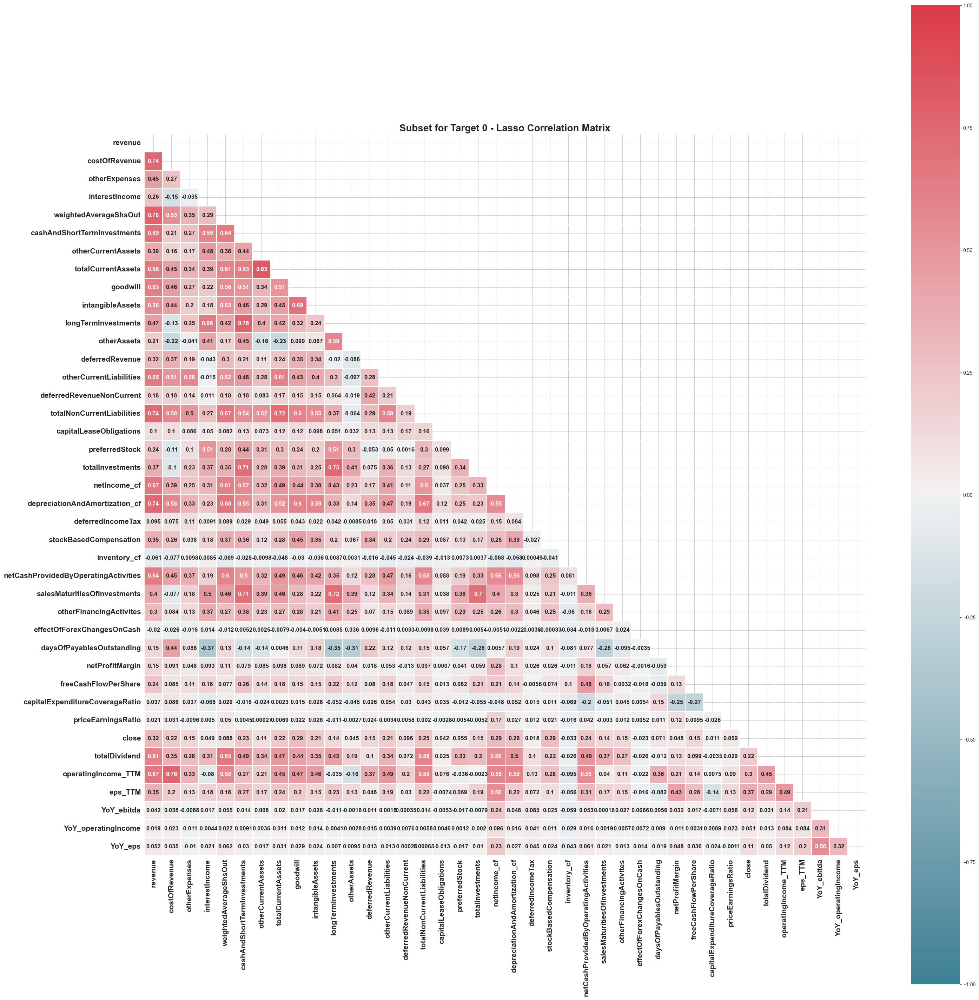

In [12]:
def cor_heat_map_half (corr,titie = 'Correlation Matrix'):
    """""""""""""""""""""
    Receives 
        correlation matrix in pandas df format 
        
    Plots Correlation matrix
    
    """""""""""""""""""""
    
    corr = corr 
    mask = np.triu(np.ones_like(corr, dtype=bool))
    
    plt.figure(figsize = (30, 30))
    sns.heatmap(corr, vmax = 1, vmin=-1, linewidths = 0.1,
               annot = True, annot_kws = {"size": 12, 'weight':'bold'}, square = True, \
                cmap=sns.diverging_palette(220, 10, as_cmap=True),
                mask = mask)
    plt.title(titie, size = 20, weight = 'bold')
    plt.yticks(size = 15, weight='bold')
    plt.xticks(size = 15, weight='bold')
    plt.tight_layout()
    return(plt)
    plt.show()
title = 'Subset for Target 0 - Lasso Correlation Matrix'
corr_plotcor_heat_map_half(x_train_out[lasso_subset_0].corr(), titie = title)